<a href="https://colab.research.google.com/github/kibarmustofa/2341720034_ML_2025/blob/main/KUIS2/Kuis2_ML_KEL6.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import random
import numpy as np
import cv2
import matplotlib.pyplot as plt

In [ ]:
import kagglehub

# Download latest version
path = kagglehub.dataset_download("misrakahmed/vegetable-image-dataset")

print("Path to dataset files:", path)

Using Colab cache for faster access to the 'vegetable-image-dataset' dataset.
Path to dataset files: /kaggle/input/vegetable-image-dataset


In [ ]:
base_images_dir = os.path.join(path, "Vegetable Images")

train_dir = os.path.join(base_images_dir, "train")
val_dir   = os.path.join(base_images_dir, "validation")
test_dir  = os.path.join(base_images_dir, "test")

print("Train dir:", train_dir)
print("Val dir  :", val_dir)
print("Test dir :", test_dir)

Train dir: /kaggle/input/vegetable-image-dataset/Vegetable Images/train
Val dir  : /kaggle/input/vegetable-image-dataset/Vegetable Images/validation
Test dir : /kaggle/input/vegetable-image-dataset/Vegetable Images/test


In [ ]:
import os

print("Root path:", path)
print("Isi path:")
for item in os.listdir(path):
    print("-", item)

Root path: /kaggle/input/vegetable-image-dataset
Isi path:
- Vegetable Images


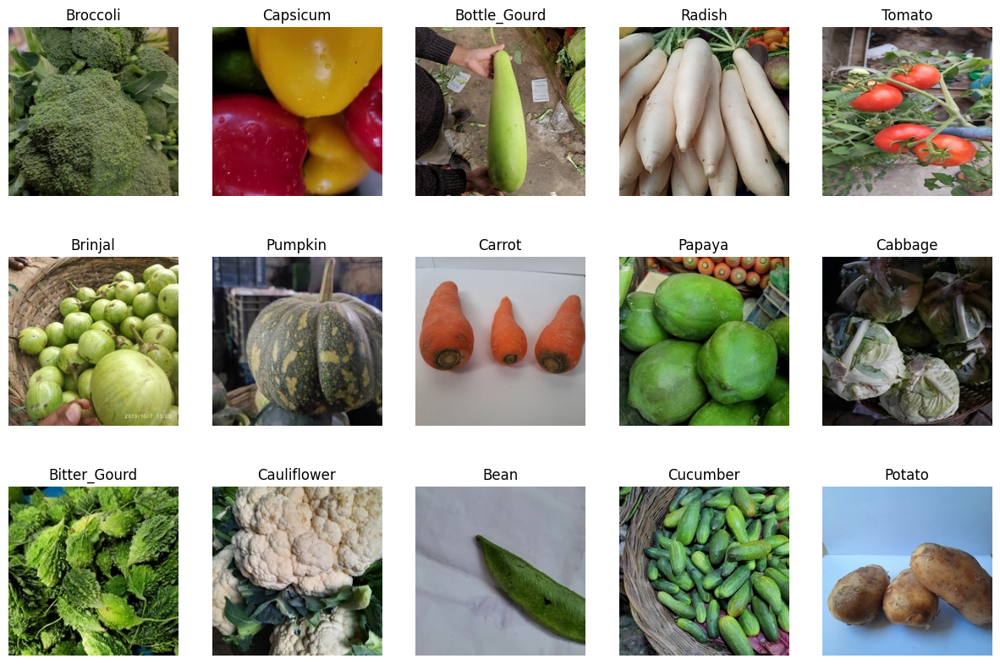

In [ ]:
image_dimensions = []

# Get list of classes
classes = os.listdir(train_dir)

plt.figure(figsize=(15, 10))

# Loop through each class and process the images
for i, class_name in enumerate(classes):
    class_dir = os.path.join(train_dir, class_name)
    images = os.listdir(class_dir)

    # Read the first image in the class directory
    image_path = os.path.join(class_dir, images[0])
    image = cv2.imread(image_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Save height, width, and number of channels
    height, width, channels = image.shape
    image_dimensions.append((height, width, channels))

    # Plot the image
    plt.subplot(3, 5, i+1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis('off')

plt.show()

In [ ]:
# Cell 3: fungsi metrik & evaluator

def load_images(paths):
    images = []
    for p in paths:
        img = cv2.imread(p)          # BGR
        if img is None:
            continue
        images.append(img)
    return images

sample_paths = get_random_image_paths(train_dir, n=12)

def get_random_image_paths(base_dir, n=8):
    class_dirs = [
        os.path.join(base_dir, d)
        for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))
    ]
    all_paths = []
    for c in class_dirs:
        files = [
            os.path.join(c, f)
            for f in os.listdir(c)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ]
        all_paths.extend(files)

    n = min(n, len(all_paths))
    return random.sample(all_paths, n)


def compute_image_stats(img_bgr):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    brightness = float(gray.mean())
    contrast = float(gray.std())
    edges = cv2.Canny(gray, 100, 200)
    edge_density = float(np.count_nonzero(edges)) / edges.size
    return brightness, contrast, edge_density


def summarize_stats(images, name=""):
    if len(images) == 0:
        print(f"{name}: no images")
        return

    b_list, c_list, e_list = [], [], []
    for img in images:
        b, c, e = compute_image_stats(img)
        b_list.append(b)
        c_list.append(c)
        e_list.append(e)

    print(f"== {name} ==")
    print(f"Brightness: {np.mean(b_list):6.2f} ± {np.std(b_list):.2f}")
    print(f"Contrast  : {np.mean(c_list):6.2f} ± {np.std(c_list):.2f}")
    print(f"Edge dens.: {np.mean(e_list):6.4f} ± {np.std(e_list):.4f}")


def evaluate_step(before_imgs, after_imgs, step_name):
    summarize_stats(before_imgs, name=f"Before {step_name}")
    summarize_stats(after_imgs,  name=f"After  {step_name}")
    show_before_after(before_imgs, after_imgs, max_images=4, title=step_name)


# Cek metrik awal
summarize_stats(orig_images, "Original images")

== Original images ==
Brightness: 122.96 ± 14.67
Contrast  :  47.23 ± 11.92
Edge dens.: 0.1005 ± 0.0760


In [ ]:
def get_all_image_paths(base_dir):
    class_dirs = [
        os.path.join(base_dir, d)
        for d in os.listdir(base_dir)
        if os.path.isdir(os.path.join(base_dir, d))
    ]
    all_paths = []
    for c in class_dirs:
        files = [
            os.path.join(c, f)
            for f in os.listdir(c)
            if f.lower().endswith((".jpg", ".jpeg", ".png"))
        ]
        all_paths.extend(files)
    return all_paths

all_paths = get_all_image_paths(train_dir)
orig_images_all = load_images(all_paths)

# Pra proses

# Step 2: Perbaikan brightness/contrast (CLAHE di HSV)

== Before CLAHE (brightness/contrast) ==
Brightness: 122.96 ± 14.67
Contrast  :  47.23 ± 11.92
Edge dens.: 0.1005 ± 0.0760
== After  CLAHE (brightness/contrast) ==
Brightness: 123.86 ± 19.25
Contrast  :  56.41 ± 9.40
Edge dens.: 0.1832 ± 0.0862


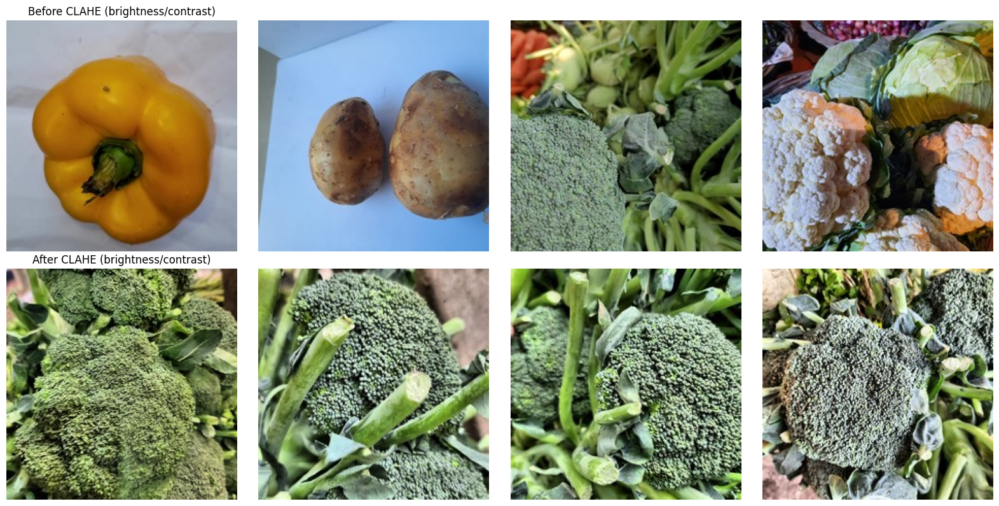

In [ ]:
# Cell 5: Color space transform + CLAHE pada channel V

def clahe_hsv(img_bgr, clip_limit=2.0, tile_grid_size=(8, 8)):
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)
    h, s, v = cv2.split(hsv)

    clahe = cv2.createCLAHE(clipLimit=clip_limit, tileGridSize=tile_grid_size)
    v_eq = clahe.apply(v)

    hsv_eq = cv2.merge([h, s, v_eq])
    img_eq = cv2.cvtColor(hsv_eq, cv2.COLOR_HSV2BGR)
    return img_eq

clahe_images = [clahe_hsv(img) for img in orig_images_all]

evaluate_step(orig_images, clahe_images, "CLAHE (brightness/contrast)")

# Step 3: Denoising (Gaussian / Median)

---- Gaussian Blur ----
== Before Gaussian blur ==
Brightness: 123.86 ± 19.25
Contrast  :  56.41 ± 9.40
Edge dens.: 0.1832 ± 0.0862
== After  Gaussian blur ==
Brightness: 123.90 ± 19.25
Contrast  :  53.30 ± 8.68
Edge dens.: 0.1372 ± 0.0731


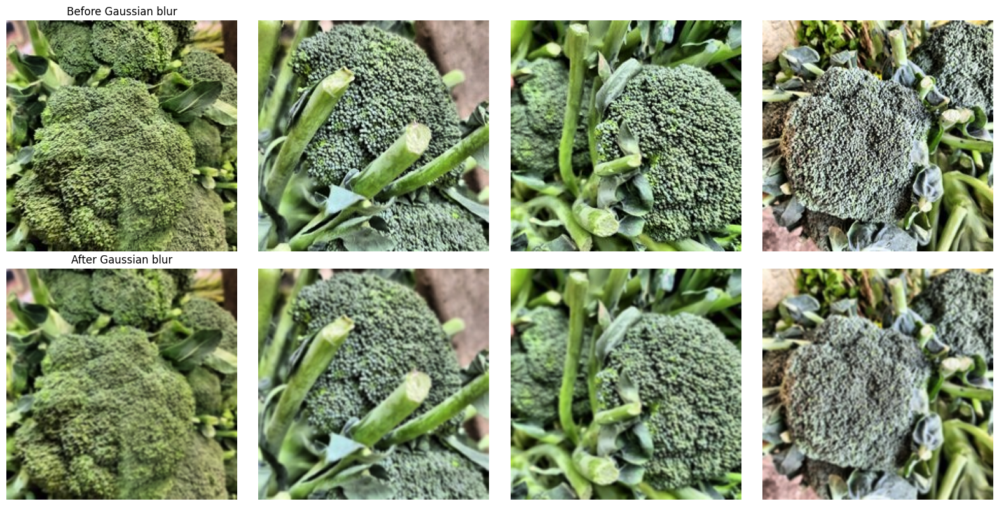


---- Median Blur ----
== Before Median blur ==
Brightness: 123.86 ± 19.25
Contrast  :  56.41 ± 9.40
Edge dens.: 0.1832 ± 0.0862
== After  Median blur ==
Brightness: 123.77 ± 19.37
Contrast  :  54.48 ± 8.97
Edge dens.: 0.1401 ± 0.0708


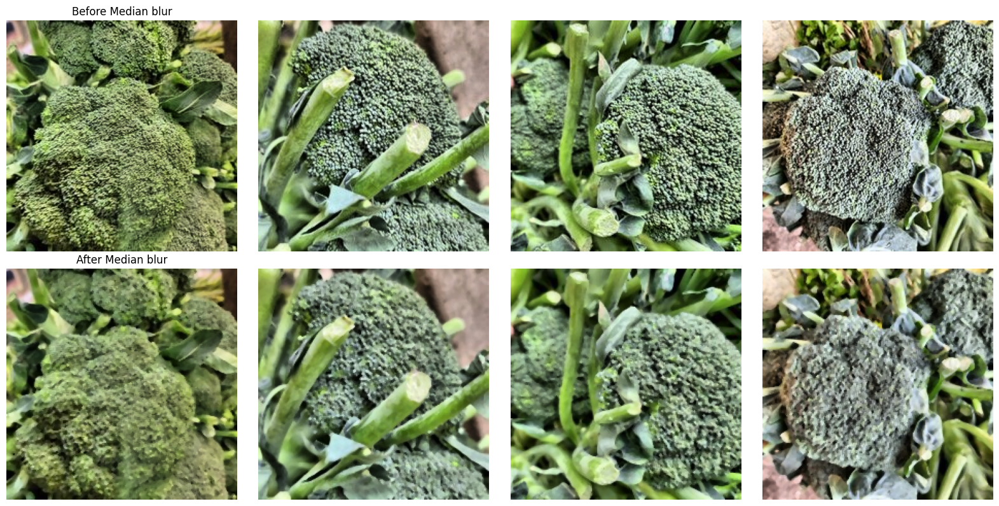

In [ ]:
# Cell 6: Gaussian blur dan Median blur

def gaussian_denoise(img_bgr, ksize=(3, 3), sigma=0):
    return cv2.GaussianBlur(img_bgr, ksize, sigma)

def median_denoise(img_bgr, ksize=3):
    return cv2.medianBlur(img_bgr, ksize)

gaussian_images = [gaussian_denoise(img) for img in clahe_images]
median_images   = [median_denoise(img)   for img in clahe_images]

print("---- Gaussian Blur ----")
evaluate_step(clahe_images, gaussian_images, "Gaussian blur")

print("\n---- Median Blur ----")
evaluate_step(clahe_images, median_images, "Median blur")

# Background subtraction (Otsu threshold)

== Before Background subtraction (Otsu) ==
Brightness: 123.90 ± 19.25
Contrast  :  53.30 ± 8.68
Edge dens.: 0.1372 ± 0.0731
== After  Background subtraction (Otsu) ==
Brightness:  38.87 ± 21.08
Contrast  :  50.08 ± 20.39
Edge dens.: 0.1075 ± 0.0458


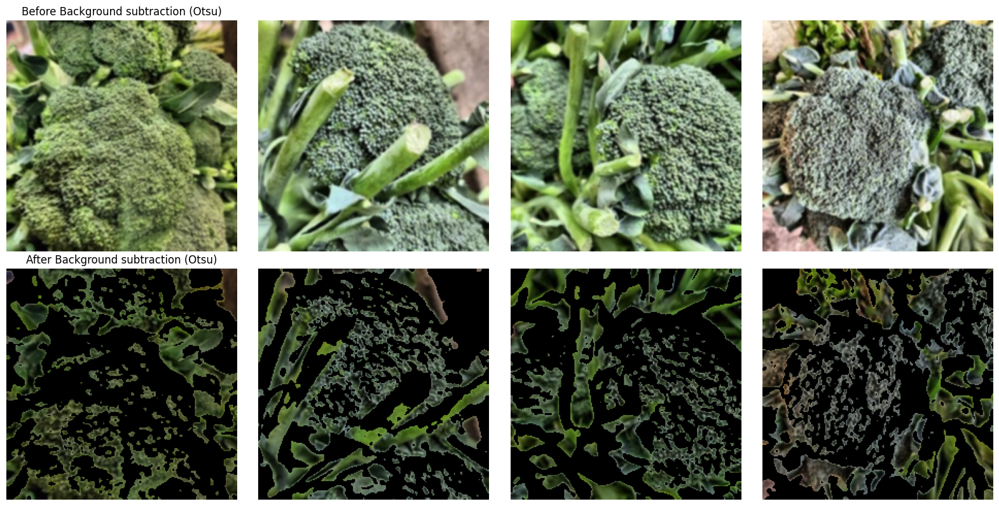

In [ ]:
# Cell: Background subtraction dengan Otsu

def get_otsu_mask(img_bgr):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5, 5), 0)

    # THRESH_BINARY + OTSU -> menghasilkan mask 0/255
    _, mask = cv2.threshold(
        blur, 0, 255,
        cv2.THRESH_BINARY + cv2.THRESH_OTSU
    )

    # Cek proporsi piksel putih. Kalau terlalu besar, berarti putih = background → dibalik.
    white_ratio = np.mean(mask == 255)
    if white_ratio > 0.5:
        mask = cv2.bitwise_not(mask)

    return mask


def apply_mask(img_bgr, mask):
    return cv2.bitwise_and(img_bgr, img_bgr, mask=mask)


# Terapkan ke seluruh sampel
rough_masks = [get_otsu_mask(img) for img in gaussian_images]
bgsub_rough_images = [
    apply_mask(img, m) for img, m in zip(gaussian_images, rough_masks)
]

# Evaluasi metrik + visual
evaluate_step(gaussian_images, bgsub_rough_images, "Background subtraction (Otsu)")


# Morphological operations: closing, opening, erosi, dilasi

== Before Morphological refine (closing+opening) ==
Brightness:  38.87 ± 21.08
Contrast  :  50.08 ± 20.39
Edge dens.: 0.1075 ± 0.0458
== After  Morphological refine (closing+opening) ==
Brightness:  48.95 ± 21.83
Contrast  :  56.31 ± 16.68
Edge dens.: 0.1096 ± 0.0516


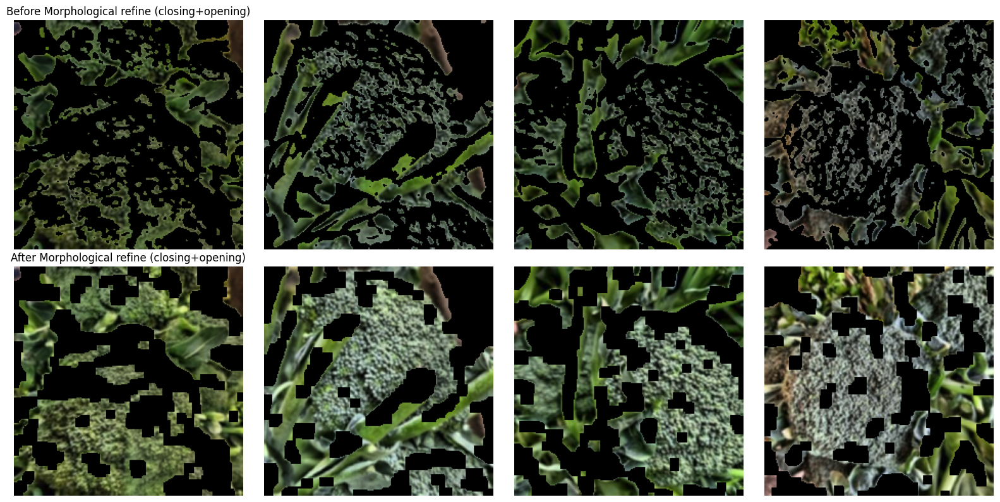

In [ ]:
# Cell: Morphological operations pada mask

def refine_mask(mask, ksize=5):
    kernel = np.ones((ksize, ksize), np.uint8)

    # Closing: fill lubang kecil di objek
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel, iterations=2)

    # Opening: buang noise kecil
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel, iterations=1)

    # Contoh erosi & dilasi satu langkah (kalau mau dianalisis / divisualkan)
    eroded  = cv2.erode(opened, kernel, iterations=1)
    dilated = cv2.dilate(opened, kernel, iterations=1)

    # Untuk pipeline utama, kita pakai `opened` sebagai mask final
    return opened, {"closed": closed, "eroded": eroded, "dilated": dilated}

refined_masks = []
debug_masks   = []

for m in rough_masks:
    refined, dbg = refine_mask(m, ksize=5)
    refined_masks.append(refined)
    debug_masks.append(dbg)

bgsub_refined_images = [
    apply_mask(img, m) for img, m in zip(gaussian_images, refined_masks)
]

# Evaluasi: dari background subtraction kasar → refined
evaluate_step(bgsub_rough_images, bgsub_refined_images,
              "Morphological refine (closing+opening)")


# K-Means mask + morfologi yang diperbaiki

=== K-Means + morphology ===
== Before K-Means LAB + closing/opening ==
Brightness: 123.90 ± 19.25
Contrast  :  53.30 ± 8.68
Edge dens.: 0.1372 ± 0.0731
== After  K-Means LAB + closing/opening ==
Brightness:  66.35 ± 21.61
Contrast  :  62.51 ± 12.10
Edge dens.: 0.1327 ± 0.0617


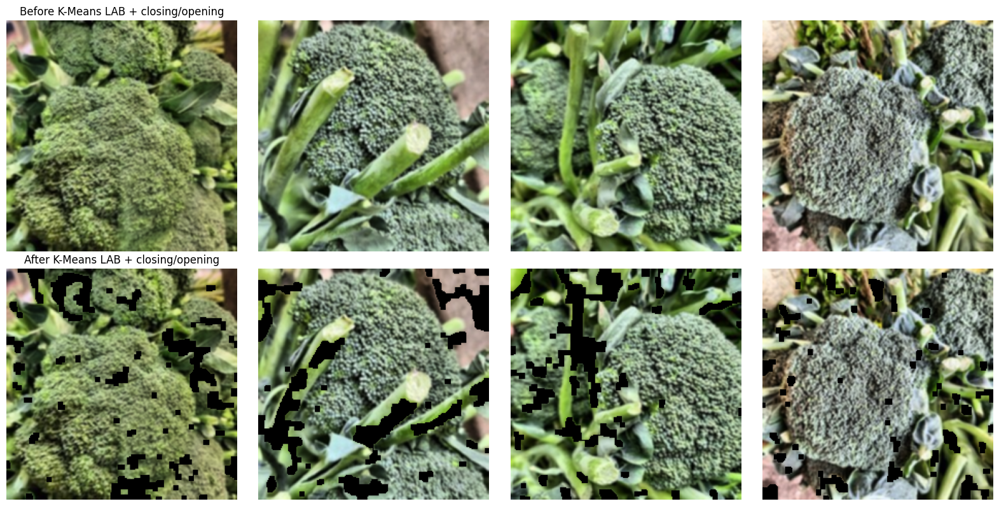

In [ ]:
# === Cell: Improved background subtraction + morphology ===

import cv2
import numpy as np

def get_kmeans_mask(img_bgr, K=3, attempts=3):
    """
    Segmentasi foreground-background pakai K-Means di ruang LAB.
    Cluster dengan area terbesar dianggap background.
    """
    lab = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2LAB)
    Z = lab.reshape((-1, 3)).astype(np.float32)

    criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
                10, 1.0)
    _ret, labels, centers = cv2.kmeans(
        Z, K, None, criteria, attempts, cv2.KMEANS_PP_CENTERS
    )

    labels = labels.reshape(lab.shape[:2])        # (H, W)
    # cluster terbanyak = background
    counts = np.bincount(labels.flatten())
    bg_label = np.argmax(counts)

    mask = np.uint8(labels != bg_label) * 255    # foreground = 255
    return mask


def refine_mask(mask, ksize=5, close_iter=1, open_iter=1):
    """
    Morphological refine yang lebih halus:
    - closing ringan untuk nutup lubang kecil
    - opening ringan untuk buang noise kecil
    Tidak terlalu agresif supaya objek tidak terpotong.
    """
    kernel = np.ones((ksize, ksize), np.uint8)

    # Closing (tutup lubang kecil di dalam objek)
    closed = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel,
                              iterations=close_iter)

    # Opening (buang noise kecil di luar objek)
    opened = cv2.morphologyEx(closed, cv2.MORPH_OPEN, kernel,
                              iterations=open_iter)

    return opened


def apply_mask(img_bgr, mask):
    return cv2.bitwise_and(img_bgr, img_bgr, mask=mask)


# ==== Terapkan ke batch contoh ====
kmeans_masks_raw = [get_kmeans_mask(img) for img in gaussian_images]
kmeans_masks_ref = [refine_mask(m, ksize=5, close_iter=1, open_iter=1)
                    for m in kmeans_masks_raw]

bgsub_kmeans_raw  = [apply_mask(img, m)
                     for img, m in zip(gaussian_images, kmeans_masks_raw)]
bgsub_kmeans_ref  = [apply_mask(img, m)
                     for img, m in zip(gaussian_images, kmeans_masks_ref)]

print("=== K-Means + morphology ===")
evaluate_step(gaussian_images, bgsub_kmeans_ref,
              "K-Means LAB + closing/opening")


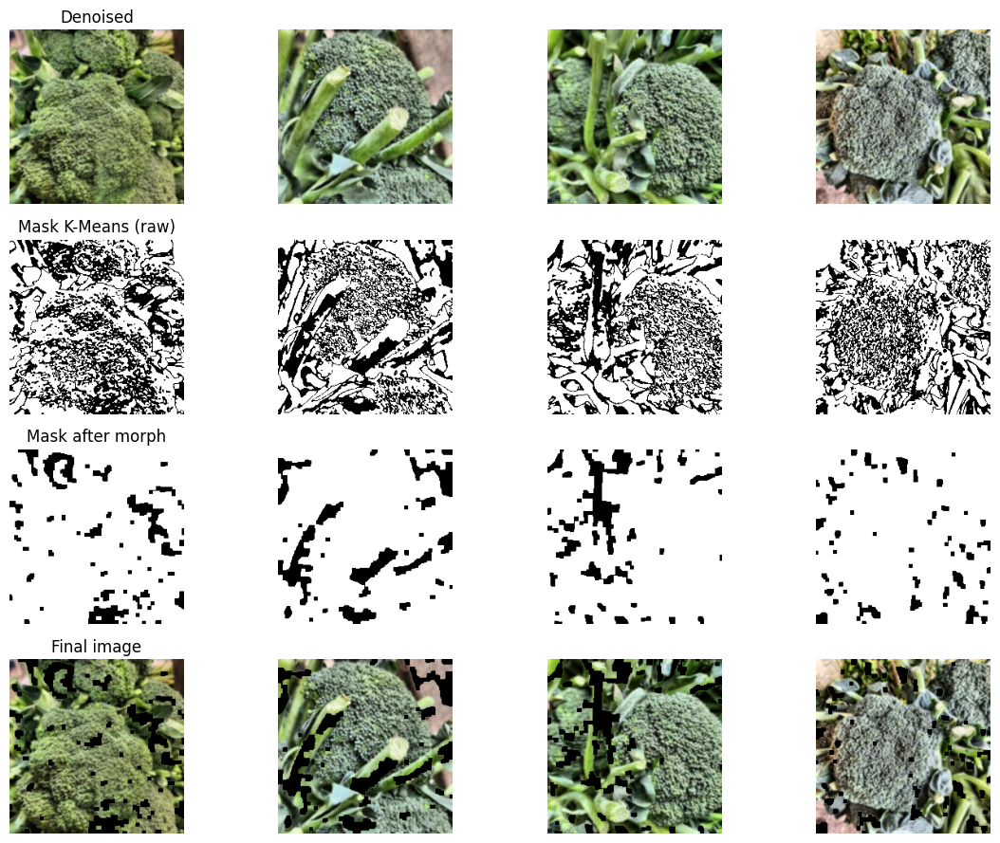

In [ ]:
# Visualisasi 3 tahap untuk beberapa gambar:
# 1) denoised
# 2) mask K-Means (raw)
# 3) mask setelah morfologi
# 4) hasil apply mask

n = 4
plt.figure(figsize=(12, 9))
for i in range(n):
    plt.subplot(4, n, i + 1)
    plt.imshow(cv2.cvtColor(gaussian_images[i], cv2.COLOR_BGR2RGB))
    plt.axis("off")
    if i == 0: plt.title("Denoised")

    plt.subplot(4, n, n + i + 1)
    plt.imshow(kmeans_masks_raw[i], cmap="gray")
    plt.axis("off")
    if i == 0: plt.title("Mask K-Means (raw)")

    plt.subplot(4, n, 2*n + i + 1)
    plt.imshow(kmeans_masks_ref[i], cmap="gray")
    plt.axis("off")
    if i == 0: plt.title("Mask after morph")

    plt.subplot(4, n, 3*n + i + 1)
    plt.imshow(cv2.cvtColor(bgsub_kmeans_ref[i], cv2.COLOR_BGR2RGB))
    plt.axis("off")
    if i == 0: plt.title("Final image")
plt.tight_layout()
plt.show()


# Ekstrasi Fitur

In [ ]:
# ========= Ekstraksi Fitur Warna (HSV Histogram) =========

def extract_color_features(img_bgr, bins=16):
    # Convert BGR ke HSV
    hsv = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2HSV)

    # Histogram untuk setiap channel (H, S, V)
    hist_h = cv2.calcHist([hsv], [0], None, [bins], [0, 180])
    hist_s = cv2.calcHist([hsv], [1], None, [bins], [0, 256])
    hist_v = cv2.calcHist([hsv], [2], None, [bins], [0, 256])

    # Normalisasi histogram
    hist_h = cv2.normalize(hist_h, hist_h).flatten()
    hist_s = cv2.normalize(hist_s, hist_s).flatten()
    hist_v = cv2.normalize(hist_v, hist_v).flatten()

    # Gabungkan menjadi satu fitur
    return np.concatenate([hist_h, hist_s, hist_v])


In [ ]:
# ========= Ekstraksi Fitur Tekstur (LBP) =========

from skimage.feature import local_binary_pattern

def extract_lbp_features(img_bgr, P=8, R=1, bins=16):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # Generate LBP image
    lbp = local_binary_pattern(gray, P, R, method="uniform")

    # Histogram LBP
    hist, _ = np.histogram(lbp.ravel(), bins=bins, range=(0, bins))

    # Normalisasi
    hist = hist.astype("float")
    hist /= (hist.sum() + 1e-6)

    return hist


In [ ]:
# ========= Ekstraksi Tekstur (GLCM) =========

from skimage.feature import graycomatrix, graycoprops

def extract_glcm_features(img_bgr):
    gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

    # GLCM (jarak 1 piksel, 4 arah)
    glcm = graycomatrix(gray, distances=[1],
                        angles=[0, np.pi/4, np.pi/2, 3*np.pi/4],
                        symmetric=True, normed=True)

    # Ambil properti tekstur
    contrast  = graycoprops(glcm, "contrast").mean()
    dissim    = graycoprops(glcm, "dissimilarity").mean()
    homogeneity = graycoprops(glcm, "homogeneity").mean()
    energy    = graycoprops(glcm, "energy").mean()
    correlation = graycoprops(glcm, "correlation").mean()

    return np.array([contrast, dissim, homogeneity, energy, correlation])

In [ ]:
# ========= Ekstraksi Fitur Bentuk =========

def extract_shape_features(img_bgr, mask):
    # Cari kontur objek
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)

    if len(contours) == 0:
        return np.zeros(10)

    cnt = max(contours, key=cv2.contourArea)  # Ambil kontur terbesar
    area = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, True)

    # Bounding box
    x, y, w, h = cv2.boundingRect(cnt)
    aspect_ratio = w / (h + 1e-6)

    # Circularity = (4πA) / P²
    circularity = 4 * np.pi * area / (perimeter * perimeter + 1e-6)

    # Hu Moments (7 fitur)
    moments = cv2.moments(cnt)
    hu = cv2.HuMoments(moments).flatten()

    # Gabungkan semua fitur bentuk
    return np.concatenate([[area, perimeter, aspect_ratio, circularity], hu])


In [ ]:
# ========= Pipeline Ekstraksi Semua Fitur =========

def extract_all_features(img_bgr, mask):
    f_color = extract_color_features(img_bgr)
    f_lbp   = extract_lbp_features(img_bgr)
    f_glcm  = extract_glcm_features(img_bgr)
    f_shape = extract_shape_features(img_bgr, mask)

    return np.concatenate([f_color, f_lbp, f_glcm, f_shape])


In [ ]:
# ========= Ekstraksi Fitur ke Semua Sample yang Sudah Diproses =========

X_features = []
y_labels = []

for img, mask, path in zip(bgsub_kmeans_ref, kmeans_masks_ref, all_paths):
    label = os.path.basename(os.path.dirname(path))  # folder = nama kelas
    feats = extract_all_features(img, mask)

    X_features.append(feats)
    y_labels.append(label)

X_features = np.array(X_features)

print("Shape fitur:", X_features.shape)
print("Jumlah label:", len(y_labels))


Shape fitur: (15000, 80)
Jumlah label: 15000


In [ ]:
# Menyimpan dataset fitur
import pandas as pd

df = pd.DataFrame(X_features)
df["label"] = y_labels

df.to_csv("dataset_fitur_sayur.csv", index=False)

print("Dataset fitur berhasil disimpan!")


Dataset fitur berhasil disimpan!


# Data Latih dan Data Uji

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split, KFold

# ============================
# 1. Load Dataset
# ============================
df = pd.read_csv("dataset_fitur_sayur.csv")

# Ganti ini dengan kolom target Anda
target_column = "label"

X = df.drop(columns=[target_column])
y = df[target_column]


# ============================
# 2. SPLIT 70 : 30
# ============================
X_train_70, X_test_30, y_train_70, y_test_30 = train_test_split(
    X, y, test_size=0.30, random_state=42, shuffle=True, stratify=y
)

# Simpan hasil
X_train_70.to_csv("train_70.csv", index=False)
X_test_30.to_csv("test_30.csv", index=False)
y_train_70.to_csv("label_train_70.csv", index=False)
y_test_30.to_csv("label_test_30.csv", index=False)


# ============================
# 3. SPLIT 80 : 20
# ============================
X_train_80, X_test_20, y_train_80, y_test_20 = train_test_split(
    X, y, test_size=0.20, random_state=42, shuffle=True, stratify=y
)

# Simpan hasil
X_train_80.to_csv("train_80.csv", index=False)
X_test_20.to_csv("test_20.csv", index=False)
y_train_80.to_csv("label_train_80.csv", index=False)
y_test_20.to_csv("label_test_20.csv", index=False)


# ============================
# 4. SPLIT 90 : 10
# ============================
X_train_90, X_test_10, y_train_90, y_test_10 = train_test_split(
    X, y, test_size=0.10, random_state=42, shuffle=True, stratify=y
)

# Simpan hasil
X_train_90.to_csv("train_90.csv", index=False)
X_test_10.to_csv("test_10.csv", index=False)
y_train_90.to_csv("label_train_90.csv", index=False)
y_test_10.to_csv("label_test_10.csv", index=False)


# ============================
# 5. K-FOLD CROSS VALIDATION (k=5)
# ============================
kf = KFold(n_splits=5, shuffle=True, random_state=42)

fold_number = 1

for train_index, test_index in kf.split(X):
    X_train_k = X.iloc[train_index]
    X_test_k = X.iloc[test_index]
    y_train_k = y.iloc[train_index]
    y_test_k = y.iloc[test_index]

    # Simpan setiap fold
    X_train_k.to_csv(f"train_fold_{fold_number}.csv", index=False)
    X_test_k.to_csv(f"test_fold_{fold_number}.csv", index=False)
    y_train_k.to_csv(f"label_train_fold_{fold_number}.csv", index=False)
    y_test_k.to_csv(f"label_test_fold_{fold_number}.csv", index=False)

    print(f"Fold {fold_number} selesai disimpan.")
    fold_number += 1

Fold 1 selesai disimpan.
Fold 2 selesai disimpan.
Fold 3 selesai disimpan.
Fold 4 selesai disimpan.
Fold 5 selesai disimpan.


In [ ]:
# ============================
# HELPER: LOAD DATA SPLIT
# ============================
import pandas as pd

def load_split(split="80_20"):
    """
    split: '70_30', '80_20', atau '90_10'
    return: X_train, X_test, y_train, y_test (pandas DataFrame/Series)
    """
    if split == "70_30":
        X_train = pd.read_csv("train_70.csv")
        X_test  = pd.read_csv("test_30.csv")
        y_train = pd.read_csv("label_train_70.csv")
        y_test  = pd.read_csv("label_test_30.csv")
    elif split == "80_20":
        X_train = pd.read_csv("train_80.csv")
        X_test  = pd.read_csv("test_20.csv")
        y_train = pd.read_csv("label_train_80.csv")
        y_test  = pd.read_csv("label_test_20.csv")
    elif split == "90_10":
        X_train = pd.read_csv("train_90.csv")
        X_test  = pd.read_csv("test_10.csv")
        y_train = pd.read_csv("label_train_90.csv")
        y_test  = pd.read_csv("label_test_10.csv")
    else:
        raise ValueError("split harus '70_30', '80_20', atau '90_10'")

    return X_train, X_test, y_train, y_test


###Pembuatan model

###1. Decition Tree


Evaluasi Decision Tree split: 70_30

=== TRAIN METRICS (Decision Tree, 70_30) ===
Accuracy : 0.7325714285714285
Precision: 0.772812535641736
Recall   : 0.7325714285714285
F1-Score : 0.7397539799376188

=== TEST METRICS (Decision Tree, 70_30) ===
Accuracy : 0.6782222222222222
Precision: 0.7178060463278668
Recall   : 0.6782222222222222
F1-Score : 0.6855248232849784

Evaluasi Decision Tree split: 80_20
Model Decision Tree (80:20) disimpan sebagai model_DecisionTree_80_20.pkl

=== TRAIN METRICS (Decision Tree, 80_20) ===
Accuracy : 0.7096666666666667
Precision: 0.773220757983366
Recall   : 0.7096666666666667
F1-Score : 0.7241770807244895

=== TEST METRICS (Decision Tree, 80_20) ===
Accuracy : 0.6563333333333333
Precision: 0.7112120540939282
Recall   : 0.6563333333333333
F1-Score : 0.6698402271755466

Evaluasi Decision Tree split: 90_10

=== TRAIN METRICS (Decision Tree, 90_10) ===
Accuracy : 0.6817777777777778
Precision: 0.7860617786156736
Recall   : 0.6817777777777778
F1-Score : 0.698322

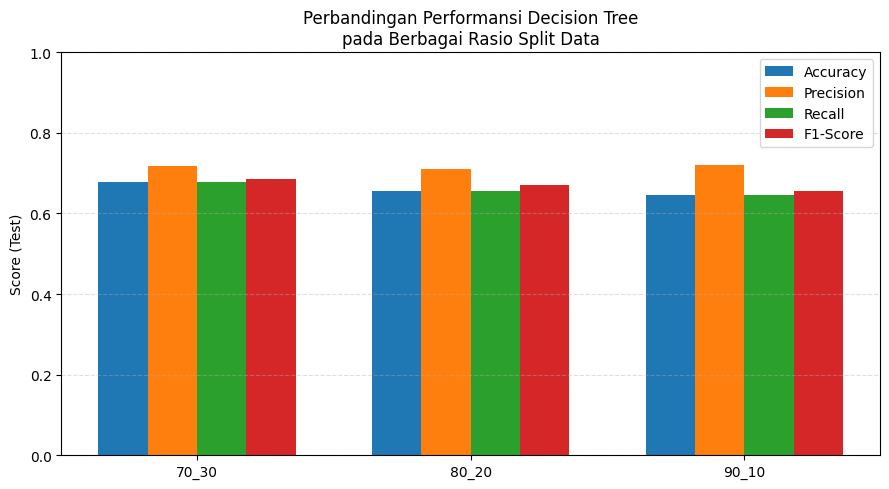

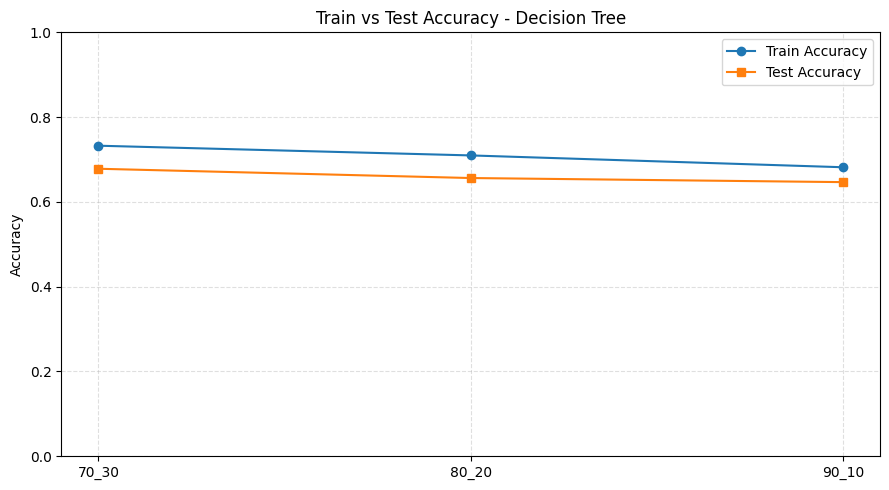


Split terbaik (berdasarkan accuracy test): 70_30

=== CLASSIFICATION REPORT (TEST, best split) ===
              precision    recall  f1-score   support

        Bean       0.66      0.69      0.68       300
Bitter_Gourd       0.89      0.70      0.79       300
Bottle_Gourd       0.67      0.68      0.68       300
     Brinjal       0.35      0.29      0.32       300
    Broccoli       0.88      0.79      0.83       300
     Cabbage       0.36      0.64      0.46       300
    Capsicum       0.92      0.67      0.78       300
      Carrot       0.96      0.91      0.94       300
 Cauliflower       0.82      0.70      0.76       300
    Cucumber       0.85      0.45      0.59       300
      Papaya       0.49      0.76      0.59       300
      Potato       0.88      0.78      0.83       300
     Pumpkin       0.75      0.66      0.70       300
      Radish       0.71      0.79      0.75       300
      Tomato       0.56      0.66      0.61       300

    accuracy                      

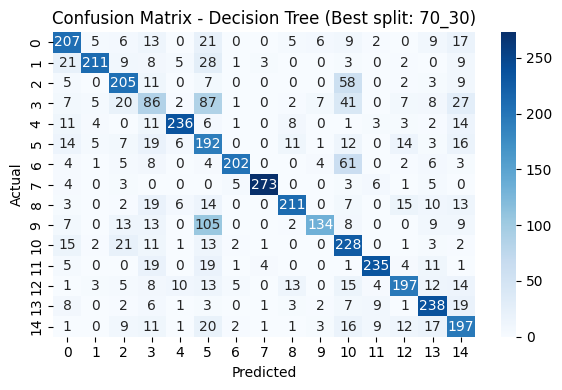

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
import seaborn as sns
import joblib

# ========================================
# Helper: jalankan Decision Tree untuk 1 skenario split
# ========================================

def run_dt_for_split(split_name):
    """
    split_name: '70_30', '80_20', atau '90_10'
    """
    # LOAD DATA via helper
    X_train, X_test, y_train, y_test = load_split(split_name)

    # STANDARISASI FITUR (optional untuk DT, tapi kita pakai biar konsisten)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)

    # MODEL DECISION TREE
    dt_model = DecisionTreeClassifier(
        criterion="gini",
        max_depth=10,
        min_samples_leaf=5,
        random_state=42
    )

    # Training
    dt_model.fit(X_train_scaled, y_train.values.ravel())

    # Simpan model + scaler khusus satu split (misal 80:20 jadi default)
    if split_name == "80_20":
        joblib.dump(
            {"model": dt_model, "scaler": scaler},
            "model_DecisionTree_80_20.pkl"
        )
        print("Model Decision Tree (80:20) disimpan sebagai model_DecisionTree_80_20.pkl")

    # PREDIKSI
    y_pred_train = dt_model.predict(X_train_scaled)
    y_pred_test  = dt_model.predict(X_test_scaled)

    # METRIK TRAINING
    acc_train  = accuracy_score(y_train, y_pred_train)
    prec_train = precision_score(y_train, y_pred_train, average='weighted')
    rec_train  = recall_score(y_train, y_pred_train, average='weighted')
    f1_train   = f1_score(y_train, y_pred_train, average='weighted')

    # METRIK TESTING
    acc_test  = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='weighted')
    rec_test  = recall_score(y_test, y_pred_test, average='weighted')
    f1_test   = f1_score(y_test, y_pred_test, average='weighted')

    print(f"\n=== TRAIN METRICS (Decision Tree, {split_name}) ===")
    print("Accuracy :", acc_train)
    print("Precision:", prec_train)
    print("Recall   :", rec_train)
    print("F1-Score :", f1_train)

    print(f"\n=== TEST METRICS (Decision Tree, {split_name}) ===")
    print("Accuracy :", acc_test)
    print("Precision:", prec_test)
    print("Recall   :", rec_test)
    print("F1-Score :", f1_test)

    return {
        "split": split_name,
        "acc_train": acc_train,
        "prec_train": prec_train,
        "rec_train": rec_train,
        "f1_train": f1_train,
        "acc_test": acc_test,
        "prec_test": prec_test,
        "rec_test": rec_test,
        "f1_test": f1_test,
        "y_test": y_test,
        "y_pred_test": y_pred_test
    }


# ========================================
# Jalankan untuk semua skenario split
# ========================================

splits = ["70_30", "80_20", "90_10"]
results = []

for sp in splits:
    print("\n==============================")
    print("Evaluasi Decision Tree split:", sp)
    print("==============================")
    res = run_dt_for_split(sp)
    results.append(res)


# ========================================
# Visualisasi: perbandingan metrik antar split
# ========================================

df_res = pd.DataFrame(results)

# Bar chart: hanya METRIK TEST supaya fokus ke generalisasi
x = np.arange(len(splits))
width = 0.18

plt.figure(figsize=(9, 5))
plt.bar(x - 1.5*width, df_res["acc_test"],  width, label="Accuracy")
plt.bar(x - 0.5*width, df_res["prec_test"], width, label="Precision")
plt.bar(x + 0.5*width, df_res["rec_test"],  width, label="Recall")
plt.bar(x + 1.5*width, df_res["f1_test"],   width, label="F1-Score")

plt.xticks(x, df_res["split"])
plt.ylim(0, 1)
plt.ylabel("Score (Test)")
plt.title("Perbandingan Performansi Decision Tree\npada Berbagai Rasio Split Data")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# (Opsional) Kalau mau lihat juga overfitting:
plt.figure(figsize=(9, 5))
plt.plot(df_res["split"], df_res["acc_train"], marker="o", label="Train Accuracy")
plt.plot(df_res["split"], df_res["acc_test"],  marker="s", label="Test Accuracy")
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.title("Train vs Test Accuracy - Decision Tree")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


# ========================================
# Confusion matrix untuk split dengan akurasi test terbaik
# ========================================

best = max(results, key=lambda r: r["acc_test"])
print("\nSplit terbaik (berdasarkan accuracy test):", best["split"])
print("\n=== CLASSIFICATION REPORT (TEST, best split) ===")
print(classification_report(best["y_test"], best["y_pred_test"]))

cm = confusion_matrix(best["y_test"], best["y_pred_test"])

plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix - Decision Tree (Best split: {best['split']})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()


###2. Naive Bayes


Evaluasi Naive Bayes split: 70_30

[70_30] Jumlah data latih : 10500
[70_30] Jumlah data uji   : 4500
Model Naive Bayes (70_30) berhasil dilatih.

=== TRAIN METRICS (Naive Bayes, 70_30) ===
Accuracy : 0.5293333333333333
Precision: 0.564152835268666
Recall   : 0.5293333333333333
F1-Score : 0.5008404834650142

=== TEST METRICS (Naive Bayes, 70_30) ===
Accuracy : 0.5193333333333333
Precision: 0.5570212703480764
Recall   : 0.5193333333333333
F1-Score : 0.4898972424664556

Evaluasi Naive Bayes split: 80_20

[80_20] Jumlah data latih : 12000
[80_20] Jumlah data uji   : 3000
Model Naive Bayes (80_20) berhasil dilatih.
Model Naive Bayes (80:20) disimpan sebagai model_NaiveBayes_80_20.pkl

=== TRAIN METRICS (Naive Bayes, 80_20) ===
Accuracy : 0.52675
Precision: 0.5622970981810028
Recall   : 0.52675
F1-Score : 0.49928143672190195

=== TEST METRICS (Naive Bayes, 80_20) ===
Accuracy : 0.522
Precision: 0.5615342920330955
Recall   : 0.522
F1-Score : 0.49390399872817653

Evaluasi Naive Bayes split: 

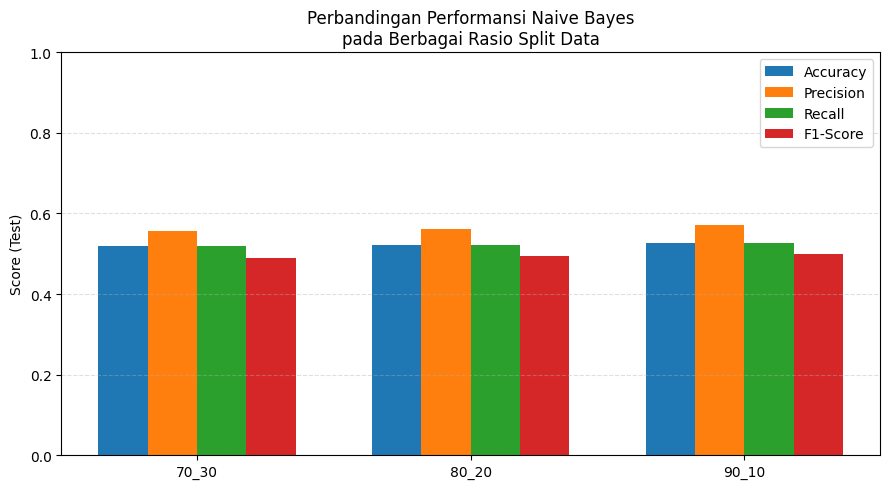

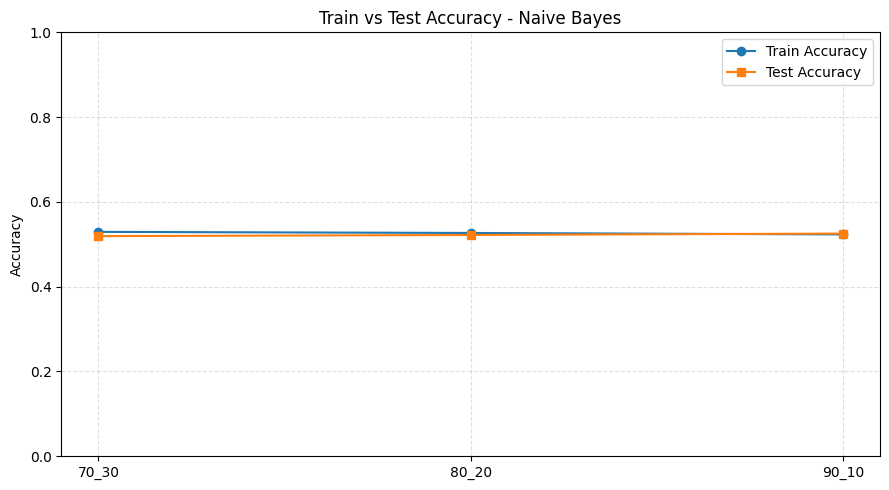


Split terbaik Naive Bayes (berdasarkan accuracy test): 90_10

=== CLASSIFICATION REPORT (TEST, best split) ===
              precision    recall  f1-score   support

        Bean       0.64      0.09      0.16       100
Bitter_Gourd       0.52      0.76      0.62       100
Bottle_Gourd       0.86      0.24      0.38       100
     Brinjal       0.27      0.35      0.30       100
    Broccoli       0.55      0.77      0.64       100
     Cabbage       0.54      0.14      0.22       100
    Capsicum       0.60      0.68      0.64       100
      Carrot       0.97      0.72      0.83       100
 Cauliflower       0.57      0.42      0.48       100
    Cucumber       0.44      0.35      0.39       100
      Papaya       0.40      0.79      0.53       100
      Potato       0.57      0.91      0.70       100
     Pumpkin       0.46      0.76      0.57       100
      Radish       0.65      0.53      0.59       100
      Tomato       0.52      0.37      0.43       100

    accuracy          

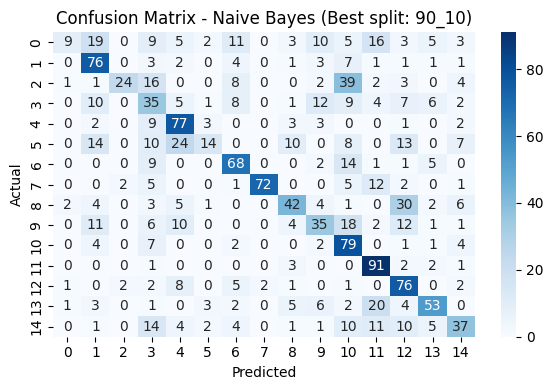

In [ ]:
### 2. Naive Bayes

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
import seaborn as sns
import joblib


def run_nb_for_split(split_name):
    """
    split_name: '70_30', '80_20', atau '90_10'
    """
    # LOAD DATA via helper
    X_train, X_test, y_train, y_test = load_split(split_name)

    print(f"\n[{split_name}] Jumlah data latih : {len(X_train)}")
    print(f"[{split_name}] Jumlah data uji   : {len(X_test)}")

    # STANDARISASI FITUR (optional tapi konsisten dengan model lain)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)

    # MODEL NAIVE BAYES
    nb_model = GaussianNB()

    # TRAINING
    nb_model.fit(X_train_scaled, y_train.values.ravel())
    print(f"Model Naive Bayes ({split_name}) berhasil dilatih.")

    # Simpan model + scaler (misal split 80:20 sebagai default)
    if split_name == "80_20":
        joblib.dump(
            {"model": nb_model, "scaler": scaler},
            "model_NaiveBayes_80_20.pkl"
        )
        print("Model Naive Bayes (80:20) disimpan sebagai model_NaiveBayes_80_20.pkl")

    # PREDIKSI
    y_pred_train = nb_model.predict(X_train_scaled)
    y_pred_test  = nb_model.predict(X_test_scaled)

    # METRIK TRAINING
    acc_train  = accuracy_score(y_train, y_pred_train)
    prec_train = precision_score(y_train, y_pred_train, average='weighted')
    rec_train  = recall_score(y_train, y_pred_train, average='weighted')
    f1_train   = f1_score(y_train, y_pred_train, average='weighted')

    # METRIK TESTING
    acc_test  = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='weighted')
    rec_test  = recall_score(y_test, y_pred_test, average='weighted')
    f1_test   = f1_score(y_test, y_pred_test, average='weighted')

    print(f"\n=== TRAIN METRICS (Naive Bayes, {split_name}) ===")
    print("Accuracy :", acc_train)
    print("Precision:", prec_train)
    print("Recall   :", rec_train)
    print("F1-Score :", f1_train)

    print(f"\n=== TEST METRICS (Naive Bayes, {split_name}) ===")
    print("Accuracy :", acc_test)
    print("Precision:", prec_test)
    print("Recall   :", rec_test)
    print("F1-Score :", f1_test)

    return {
        "split": split_name,
        "acc_train": acc_train,
        "prec_train": prec_train,
        "rec_train": rec_train,
        "f1_train": f1_train,
        "acc_test": acc_test,
        "prec_test": prec_test,
        "rec_test": rec_test,
        "f1_test": f1_test,
        "y_test": y_test,
        "y_pred_test": y_pred_test
    }



splits = ["70_30", "80_20", "90_10"]
results_nb = []

for sp in splits:
    print("\n==============================")
    print("Evaluasi Naive Bayes split:", sp)
    print("==============================")
    res = run_nb_for_split(sp)
    results_nb.append(res)


df_nb = pd.DataFrame(results_nb)

x = np.arange(len(splits))
width = 0.18

plt.figure(figsize=(9, 5))
plt.bar(x - 1.5*width, df_nb["acc_test"],  width, label="Accuracy")
plt.bar(x - 0.5*width, df_nb["prec_test"], width, label="Precision")
plt.bar(x + 0.5*width, df_nb["rec_test"],  width, label="Recall")
plt.bar(x + 1.5*width, df_nb["f1_test"],   width, label="F1-Score")

plt.xticks(x, df_nb["split"])
plt.ylim(0, 1)
plt.ylabel("Score (Test)")
plt.title("Perbandingan Performansi Naive Bayes\npada Berbagai Rasio Split Data")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


plt.figure(figsize=(9, 5))
plt.plot(df_nb["split"], df_nb["acc_train"], marker="o", label="Train Accuracy")
plt.plot(df_nb["split"], df_nb["acc_test"],  marker="s", label="Test Accuracy")
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.title("Train vs Test Accuracy - Naive Bayes")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()



best_nb = max(results_nb, key=lambda r: r["acc_test"])
print("\nSplit terbaik Naive Bayes (berdasarkan accuracy test):", best_nb["split"])
print("\n=== CLASSIFICATION REPORT (TEST, best split) ===")
print(classification_report(best_nb["y_test"], best_nb["y_pred_test"]))

cm = confusion_matrix(best_nb["y_test"], best_nb["y_pred_test"])
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix - Naive Bayes (Best split: {best_nb['split']})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()


###3. Linear Discriminant Analysis


Evaluasi LDA split: 70_30

[70_30] Jumlah data latih : 10500
[70_30] Jumlah data uji   : 4500
Model LDA (70_30) berhasil dilatih.

=== TRAIN METRICS (LDA, 70_30) ===
Accuracy : 0.7955238095238095
Precision: 0.8011369932040793
Recall   : 0.7955238095238095
F1-Score : 0.7965678718273328

=== TEST METRICS (LDA, 70_30) ===
Accuracy : 0.7782222222222223
Precision: 0.7864208378025369
Recall   : 0.7782222222222223
F1-Score : 0.7797366795556251

Evaluasi LDA split: 80_20

[80_20] Jumlah data latih : 12000
[80_20] Jumlah data uji   : 3000
Model LDA (80_20) berhasil dilatih.
Model LDA (80:20) disimpan sebagai model_LDA_80_20.pkl

=== TRAIN METRICS (LDA, 80_20) ===
Accuracy : 0.79625
Precision: 0.8018003973655504
Recall   : 0.79625
F1-Score : 0.7973644136704343

=== TEST METRICS (LDA, 80_20) ===
Accuracy : 0.786
Precision: 0.795245817269748
Recall   : 0.786
F1-Score : 0.7878813531345529

Evaluasi LDA split: 90_10

[90_10] Jumlah data latih : 13500
[90_10] Jumlah data uji   : 1500
Model LDA (90_1

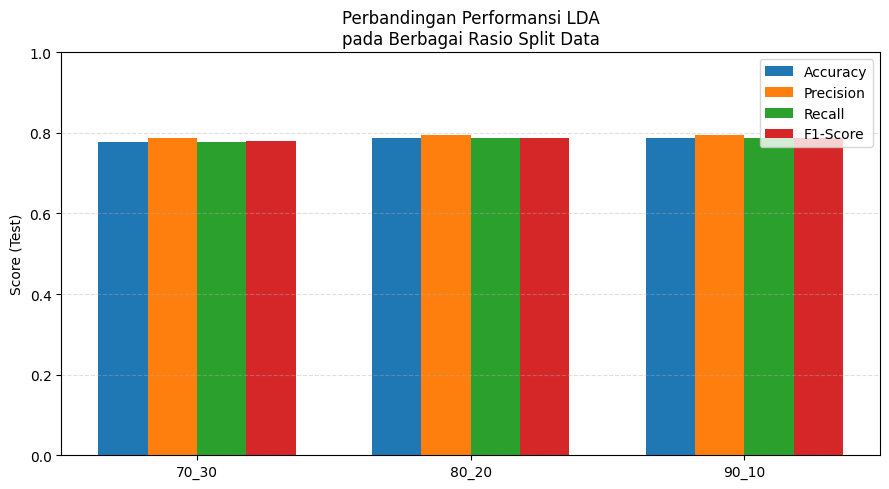

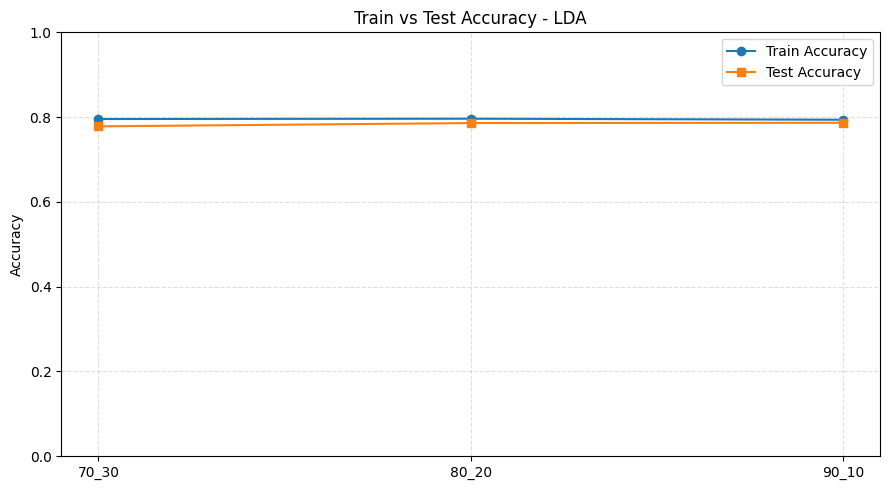


Split terbaik LDA (berdasarkan accuracy test): 90_10

=== CLASSIFICATION REPORT (TEST, best split) ===
              precision    recall  f1-score   support

        Bean       0.67      0.74      0.70       100
Bitter_Gourd       0.92      0.88      0.90       100
Bottle_Gourd       0.74      0.73      0.74       100
     Brinjal       0.57      0.67      0.61       100
    Broccoli       0.97      0.83      0.89       100
     Cabbage       0.76      0.84      0.80       100
    Capsicum       0.91      0.69      0.78       100
      Carrot       0.92      0.89      0.90       100
 Cauliflower       0.75      0.83      0.79       100
    Cucumber       0.67      0.58      0.62       100
      Papaya       0.69      0.82      0.75       100
      Potato       0.86      0.92      0.89       100
     Pumpkin       0.88      0.88      0.88       100
      Radish       0.82      0.80      0.81       100
      Tomato       0.80      0.70      0.74       100

    accuracy                  

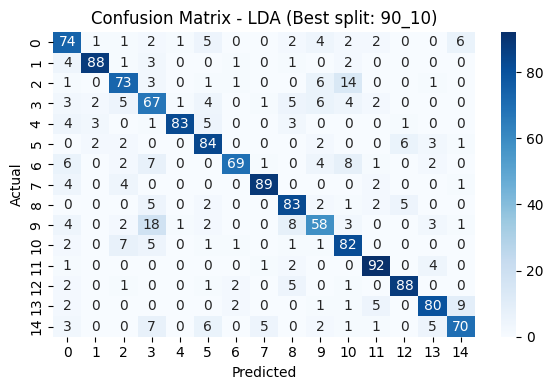

In [ ]:
### 3. Linear Discriminant Analysis (LDA)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
import seaborn as sns
import joblib


def run_lda_for_split(split_name):
    """
    split_name: '70_30', '80_20', atau '90_10'
    """
    # LOAD DATA via helper
    X_train, X_test, y_train, y_test = load_split(split_name)

    print(f"\n[{split_name}] Jumlah data latih : {len(X_train)}")
    print(f"[{split_name}] Jumlah data uji   : {len(X_test)}")

    # STANDARISASI FITUR (sangat disarankan untuk LDA)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)

    # MODEL LDA (tanpa hypertuning dulu)
    lda_model = LinearDiscriminantAnalysis()

    # TRAINING
    lda_model.fit(X_train_scaled, y_train.values.ravel())
    print(f"Model LDA ({split_name}) berhasil dilatih.")

    # Simpan model + scaler untuk split 80:20 (misal sebagai default)
    if split_name == "80_20":
        joblib.dump(
            {"model": lda_model, "scaler": scaler},
            "model_LDA_80_20.pkl"
        )
        print("Model LDA (80:20) disimpan sebagai model_LDA_80_20.pkl")

    # PREDIKSI
    y_pred_train = lda_model.predict(X_train_scaled)
    y_pred_test  = lda_model.predict(X_test_scaled)

    # METRIK TRAINING
    acc_train  = accuracy_score(y_train, y_pred_train)
    prec_train = precision_score(y_train, y_pred_train, average='weighted')
    rec_train  = recall_score(y_train, y_pred_train, average='weighted')
    f1_train   = f1_score(y_train, y_pred_train, average='weighted')

    # METRIK TESTING
    acc_test  = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='weighted')
    rec_test  = recall_score(y_test, y_pred_test, average='weighted')
    f1_test   = f1_score(y_test, y_pred_test, average='weighted')

    print(f"\n=== TRAIN METRICS (LDA, {split_name}) ===")
    print("Accuracy :", acc_train)
    print("Precision:", prec_train)
    print("Recall   :", rec_train)
    print("F1-Score :", f1_train)

    print(f"\n=== TEST METRICS (LDA, {split_name}) ===")
    print("Accuracy :", acc_test)
    print("Precision:", prec_test)
    print("Recall   :", rec_test)
    print("F1-Score :", f1_test)

    return {
        "split": split_name,
        "acc_train": acc_train,
        "prec_train": prec_train,
        "rec_train": rec_train,
        "f1_train": f1_train,
        "acc_test": acc_test,
        "prec_test": prec_test,
        "rec_test": rec_test,
        "f1_test": f1_test,
        "y_test": y_test,
        "y_pred_test": y_pred_test
    }



splits = ["70_30", "80_20", "90_10"]
results_lda = []

for sp in splits:
    print("\n==============================")
    print("Evaluasi LDA split:", sp)
    print("==============================")
    res = run_lda_for_split(sp)
    results_lda.append(res)


df_lda = pd.DataFrame(results_lda)

x = np.arange(len(splits))
width = 0.18

plt.figure(figsize=(9, 5))
plt.bar(x - 1.5*width, df_lda["acc_test"],  width, label="Accuracy")
plt.bar(x - 0.5*width, df_lda["prec_test"], width, label="Precision")
plt.bar(x + 0.5*width, df_lda["rec_test"],  width, label="Recall")
plt.bar(x + 1.5*width, df_lda["f1_test"],   width, label="F1-Score")

plt.xticks(x, df_lda["split"])
plt.ylim(0, 1)
plt.ylabel("Score (Test)")
plt.title("Perbandingan Performansi LDA\npada Berbagai Rasio Split Data")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


plt.figure(figsize=(9, 5))
plt.plot(df_lda["split"], df_lda["acc_train"], marker="o", label="Train Accuracy")
plt.plot(df_lda["split"], df_lda["acc_test"],  marker="s", label="Test Accuracy")
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.title("Train vs Test Accuracy - LDA")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()



best_lda = max(results_lda, key=lambda r: r["acc_test"])
print("\nSplit terbaik LDA (berdasarkan accuracy test):", best_lda["split"])
print("\n=== CLASSIFICATION REPORT (TEST, best split) ===")
print(classification_report(best_lda["y_test"], best_lda["y_pred_test"]))

cm = confusion_matrix(best_lda["y_test"], best_lda["y_pred_test"])
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix - LDA (Best split: {best_lda['split']})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()


###4. SVM


Evaluasi SVM split: 70_30

[70_30] Jumlah data latih : 10500
[70_30] Jumlah data uji   : 4500
Model SVM (70_30) berhasil dilatih.

=== TRAIN METRICS (SVM, 70_30) ===
Accuracy : 0.9980952380952381
Precision: 0.9981028049878804
Recall   : 0.9980952380952381
F1-Score : 0.9980967246576845

=== TEST METRICS (SVM, 70_30) ===
Accuracy : 0.9735555555555555
Precision: 0.9736754957198668
Recall   : 0.9735555555555555
F1-Score : 0.9735465324559047

Evaluasi SVM split: 80_20

[80_20] Jumlah data latih : 12000
[80_20] Jumlah data uji   : 3000
Model SVM (80_20) berhasil dilatih.
Model SVM (80:20) disimpan sebagai model_SVM_80_20.pkl

=== TRAIN METRICS (SVM, 80_20) ===
Accuracy : 0.9984166666666666
Precision: 0.9984204958401552
Recall   : 0.9984166666666666
F1-Score : 0.9984173917088719

=== TEST METRICS (SVM, 80_20) ===
Accuracy : 0.9786666666666667
Precision: 0.9787533848791417
Recall   : 0.9786666666666667
F1-Score : 0.9786512034981286

Evaluasi SVM split: 90_10

[90_10] Jumlah data latih : 13500

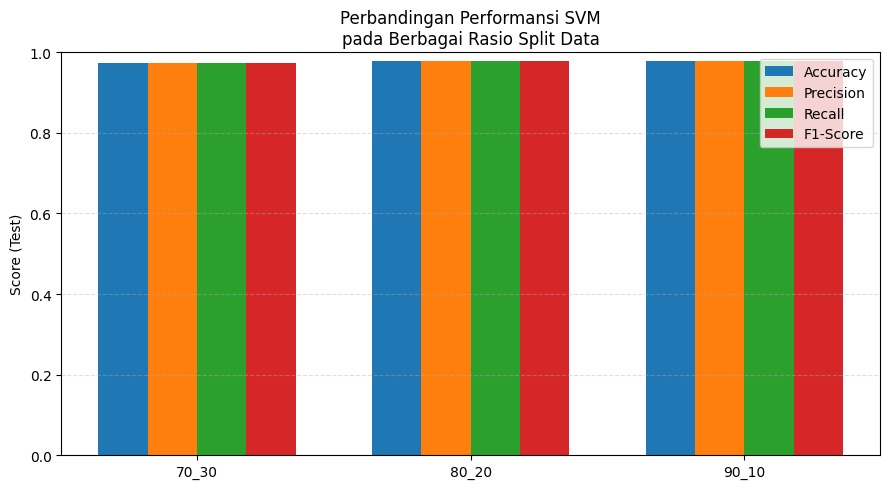

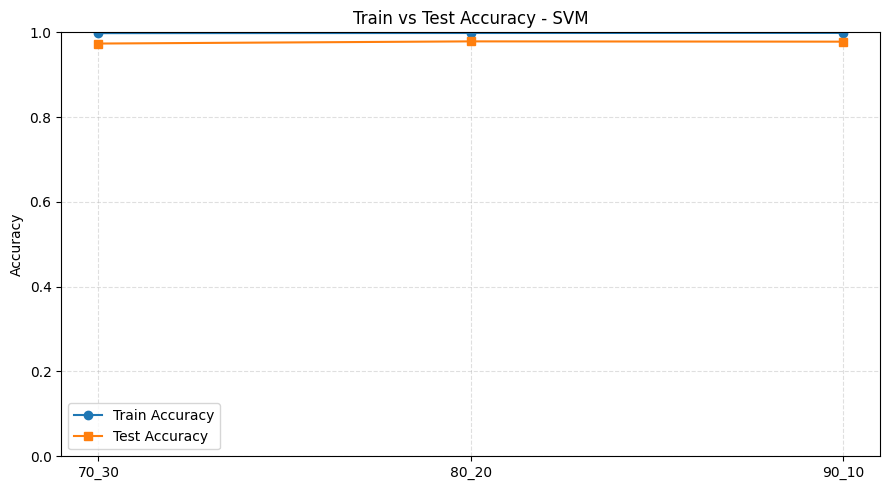


Split terbaik SVM (berdasarkan accuracy test): 80_20

=== CLASSIFICATION REPORT (TEST, best split) ===
              precision    recall  f1-score   support

        Bean       0.97      0.98      0.98       200
Bitter_Gourd       0.99      0.98      0.99       200
Bottle_Gourd       0.98      0.98      0.98       200
     Brinjal       0.97      0.97      0.97       200
    Broccoli       0.98      0.98      0.98       200
     Cabbage       0.97      0.98      0.97       200
    Capsicum       0.99      0.98      0.99       200
      Carrot       0.99      1.00      1.00       200
 Cauliflower       0.99      0.96      0.98       200
    Cucumber       0.98      1.00      0.99       200
      Papaya       0.97      0.98      0.97       200
      Potato       0.99      0.99      0.99       200
     Pumpkin       0.96      0.95      0.96       200
      Radish       0.99      0.97      0.98       200
      Tomato       0.96      0.94      0.95       200

    accuracy                  

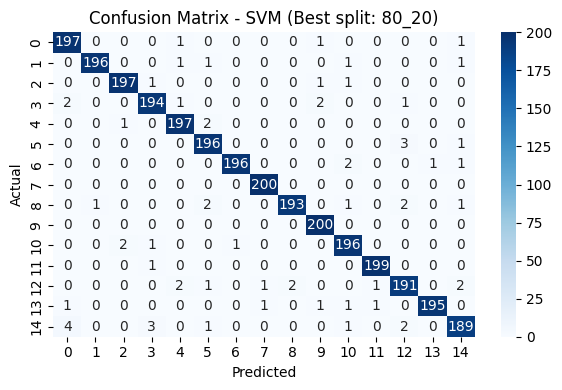


Membuat learning curve untuk SVM dengan split terbaik: 80_20


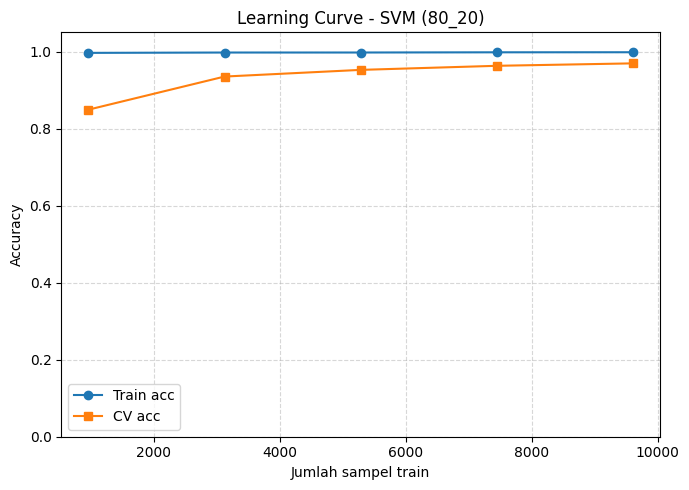

In [ ]:
### 4. SVM – Evaluasi 70:30, 80:20, 90:10 + Learning Curve

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
from sklearn.model_selection import learning_curve
import seaborn as sns
import joblib

def run_svm_for_split(split_name):
    """
    split_name: '70_30', '80_20', atau '90_10'
    """
    # LOAD DATA via helper
    X_train, X_test, y_train, y_test = load_split(split_name)

    print(f"\n[{split_name}] Jumlah data latih : {len(X_train)}")
    print(f"[{split_name}] Jumlah data uji   : {len(X_test)}")

    # STANDARISASI FITUR (WAJIB untuk SVM)
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled  = scaler.transform(X_test)

    # MODEL SVM (baseline, belum hypertuning)
    svm_model = SVC(
        kernel="rbf",
        C=10,
        gamma="scale",
        random_state=42
    )

    # Training
    svm_model.fit(X_train_scaled, y_train.values.ravel())
    print(f"Model SVM ({split_name}) berhasil dilatih.")

    # Simpan model + scaler untuk split 80:20 sebagai default
    if split_name == "80_20":
        joblib.dump(
            {"model": svm_model, "scaler": scaler},
            "model_SVM_80_20.pkl"
        )
        print("Model SVM (80:20) disimpan sebagai model_SVM_80_20.pkl")

    # PREDIKSI
    y_pred_train = svm_model.predict(X_train_scaled)
    y_pred_test  = svm_model.predict(X_test_scaled)

    # METRIK TRAINING
    acc_train  = accuracy_score(y_train, y_pred_train)
    prec_train = precision_score(y_train, y_pred_train, average='weighted')
    rec_train  = recall_score(y_train, y_pred_train, average='weighted')
    f1_train   = f1_score(y_train, y_pred_train, average='weighted')

    # METRIK TESTING
    acc_test  = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='weighted')
    rec_test  = recall_score(y_test, y_pred_test, average='weighted')
    f1_test   = f1_score(y_test, y_pred_test, average='weighted')

    print(f"\n=== TRAIN METRICS (SVM, {split_name}) ===")
    print("Accuracy :", acc_train)
    print("Precision:", prec_train)
    print("Recall   :", rec_train)
    print("F1-Score :", f1_train)

    print(f"\n=== TEST METRICS (SVM, {split_name}) ===")
    print("Accuracy :", acc_test)
    print("Precision:", prec_test)
    print("Recall   :", rec_test)
    print("F1-Score :", f1_test)

    return {
        "split": split_name,
        "acc_train": acc_train,
        "prec_train": prec_train,
        "rec_train": rec_train,
        "f1_train": f1_train,
        "acc_test": acc_test,
        "prec_test": prec_test,
        "rec_test": rec_test,
        "f1_test": f1_test,
        "y_test": y_test,
        "y_pred_test": y_pred_test
    }



splits = ["70_30", "80_20", "90_10"]
results_svm = []

for sp in splits:
    print("\n==============================")
    print("Evaluasi SVM split:", sp)
    print("==============================")
    res = run_svm_for_split(sp)
    results_svm.append(res)



df_svm = pd.DataFrame(results_svm)

x = np.arange(len(splits))
width = 0.18

plt.figure(figsize=(9, 5))
plt.bar(x - 1.5*width, df_svm["acc_test"],  width, label="Accuracy")
plt.bar(x - 0.5*width, df_svm["prec_test"], width, label="Precision")
plt.bar(x + 0.5*width, df_svm["rec_test"],  width, label="Recall")
plt.bar(x + 1.5*width, df_svm["f1_test"],   width, label="F1-Score")

plt.xticks(x, df_svm["split"])
plt.ylim(0, 1)
plt.ylabel("Score (Test)")
plt.title("Perbandingan Performansi SVM\npada Berbagai Rasio Split Data")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()


plt.figure(figsize=(9, 5))
plt.plot(df_svm["split"], df_svm["acc_train"], marker="o", label="Train Accuracy")
plt.plot(df_svm["split"], df_svm["acc_test"],  marker="s", label="Test Accuracy")
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.title("Train vs Test Accuracy - SVM")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


best_svm = max(results_svm, key=lambda r: r["acc_test"])
print("\nSplit terbaik SVM (berdasarkan accuracy test):", best_svm["split"])
print("\n=== CLASSIFICATION REPORT (TEST, best split) ===")
print(classification_report(best_svm["y_test"], best_svm["y_pred_test"]))

cm = confusion_matrix(best_svm["y_test"], best_svm["y_pred_test"])
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title(f"Confusion Matrix - SVM (Best split: {best_svm['split']})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()



best_split_name = best_svm["split"]
print("\nMembuat learning curve untuk SVM dengan split terbaik:", best_split_name)

# Reload data split terbaik
X_train_best, X_test_best, y_train_best, y_test_best = load_split(best_split_name)

scaler_best = StandardScaler()
X_train_best_scaled = scaler_best.fit_transform(X_train_best)

svm_best = SVC(
    kernel="rbf",
    C=10,
    gamma="scale",
    random_state=42
)

train_sizes, train_scores, val_scores = learning_curve(
    svm_best,
    X_train_best_scaled, y_train_best.values.ravel(),
    cv=5,
    scoring='accuracy',
    train_sizes=np.linspace(0.1, 1.0, 5),
    n_jobs=-1,
    shuffle=True,
    random_state=42
)

train_mean = train_scores.mean(axis=1)
val_mean   = val_scores.mean(axis=1)

plt.figure(figsize=(7, 5))
plt.plot(train_sizes, train_mean, marker='o', label='Train acc')
plt.plot(train_sizes, val_mean,   marker='s', label='CV acc')
plt.xlabel("Jumlah sampel train")
plt.ylabel("Accuracy")
plt.title(f"Learning Curve - SVM ({best_split_name})")
plt.ylim(0, 1.05)
plt.grid(True, linestyle='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()

###5. Bagging


Evaluasi Bagging DT split: 70_30

[70_30] Jumlah data latih : 10500
[70_30] Jumlah data uji   : 4500
Model Bagging (DT) (70_30) berhasil dilatih.

=== TRAIN METRICS (Bagging DT, 70_30) ===
Accuracy : 1.0
Precision: 1.0
Recall   : 1.0
F1-Score : 1.0

=== TEST METRICS (Bagging DT, 70_30) ===
Accuracy : 0.9346666666666666
Precision: 0.9347379477370149
Recall   : 0.9346666666666666
F1-Score : 0.9344135032171171

Evaluasi Bagging DT split: 80_20

[80_20] Jumlah data latih : 12000
[80_20] Jumlah data uji   : 3000
Model Bagging (DT) (80_20) berhasil dilatih.
Model Bagging (DT, 80:20) disimpan sebagai model_Bagging_DT_80_20.pkl

=== TRAIN METRICS (Bagging DT, 80_20) ===
Accuracy : 1.0
Precision: 1.0
Recall   : 1.0
F1-Score : 1.0

=== TEST METRICS (Bagging DT, 80_20) ===
Accuracy : 0.9456666666666667
Precision: 0.9457680626727994
Recall   : 0.9456666666666667
F1-Score : 0.9454899991342204

Evaluasi Bagging DT split: 90_10

[90_10] Jumlah data latih : 13500
[90_10] Jumlah data uji   : 1500
Mode

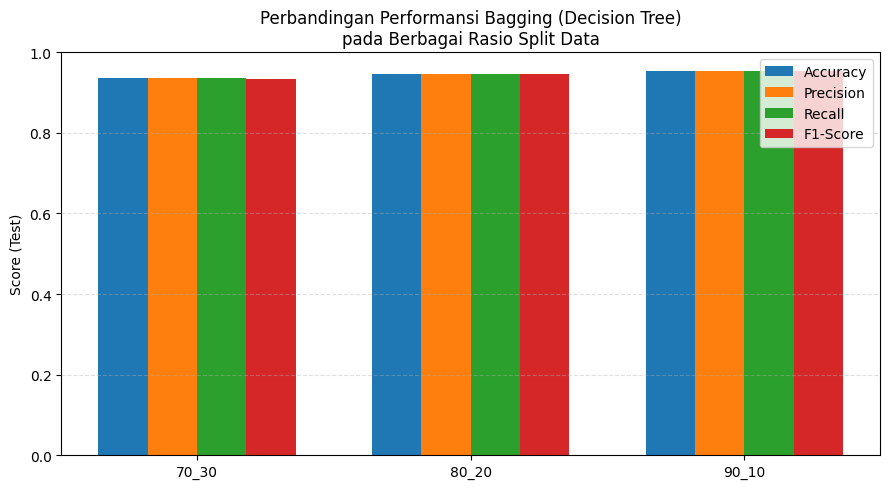

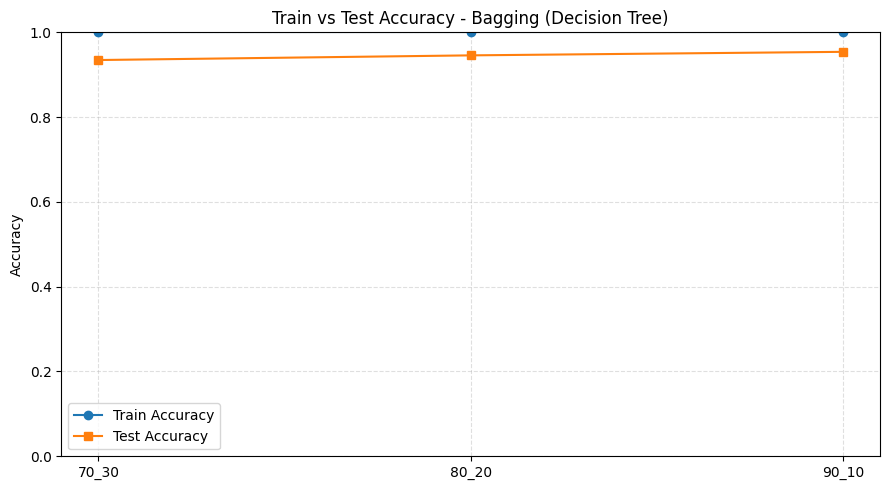


Split terbaik Bagging (DT) (berdasarkan accuracy test): 90_10

=== CLASSIFICATION REPORT (TEST, best split) ===
              precision    recall  f1-score   support

        Bean       0.99      0.96      0.97       100
Bitter_Gourd       0.95      0.96      0.96       100
Bottle_Gourd       0.95      0.97      0.96       100
     Brinjal       0.93      0.92      0.92       100
    Broccoli       0.98      0.98      0.98       100
     Cabbage       0.97      0.90      0.93       100
    Capsicum       0.95      0.96      0.96       100
      Carrot       0.98      0.98      0.98       100
 Cauliflower       0.90      0.95      0.93       100
    Cucumber       0.95      0.95      0.95       100
      Papaya       0.94      0.94      0.94       100
      Potato       0.99      0.98      0.98       100
     Pumpkin       0.94      0.93      0.93       100
      Radish       0.96      0.96      0.96       100
      Tomato       0.93      0.97      0.95       100

    accuracy         

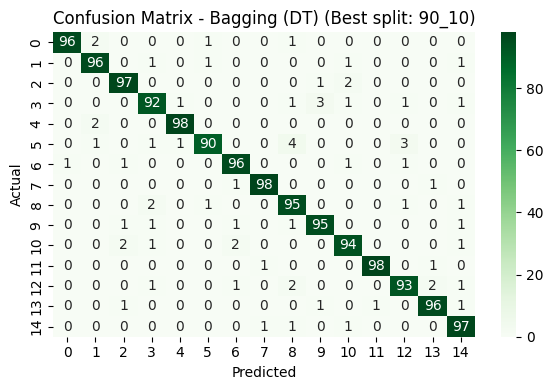

In [ ]:
### 5. Bagging (Decision Tree)

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
import seaborn as sns
import joblib


def run_bagging_for_split(split_name):
    """
    split_name: '70_30', '80_20', atau '90_10'
    """
    # LOAD DATA via helper
    X_train, X_test, y_train, y_test = load_split(split_name)

    print(f"\n[{split_name}] Jumlah data latih : {len(X_train)}")
    print(f"[{split_name}] Jumlah data uji   : {len(X_test)}")

    # MODEL BAGGING (base estimator: Decision Tree)
    base_dt = DecisionTreeClassifier(
        max_depth=None,
        random_state=42
    )

    bagging_model = BaggingClassifier(
        estimator=base_dt,     # kalau sklearn lama: base_estimator=base_dt
        n_estimators=50,
        max_samples=1.0,
        max_features=1.0,
        bootstrap=True,
        n_jobs=-1,
        random_state=42
    )

    # Training
    bagging_model.fit(X_train, y_train.values.ravel())
    print(f"Model Bagging (DT) ({split_name}) berhasil dilatih.")

    # Simpan model untuk split 80:20 sebagai default
    if split_name == "80_20":
        joblib.dump(bagging_model, "model_Bagging_DT_80_20.pkl")
        print("Model Bagging (DT, 80:20) disimpan sebagai model_Bagging_DT_80_20.pkl")

    # PREDIKSI
    y_pred_train = bagging_model.predict(X_train)
    y_pred_test  = bagging_model.predict(X_test)

    # METRIK TRAINING
    acc_train  = accuracy_score(y_train, y_pred_train)
    prec_train = precision_score(y_train, y_pred_train, average='weighted')
    rec_train  = recall_score(y_train, y_pred_train, average='weighted')
    f1_train   = f1_score(y_train, y_pred_train, average='weighted')

    # METRIK TESTING
    acc_test  = accuracy_score(y_test, y_pred_test)
    prec_test = precision_score(y_test, y_pred_test, average='weighted')
    rec_test  = recall_score(y_test, y_pred_test, average='weighted')
    f1_test   = f1_score(y_test, y_pred_test, average='weighted')

    print(f"\n=== TRAIN METRICS (Bagging DT, {split_name}) ===")
    print("Accuracy :", acc_train)
    print("Precision:", prec_train)
    print("Recall   :", rec_train)
    print("F1-Score :", f1_train)

    print(f"\n=== TEST METRICS (Bagging DT, {split_name}) ===")
    print("Accuracy :", acc_test)
    print("Precision:", prec_test)
    print("Recall   :", rec_test)
    print("F1-Score :", f1_test)

    return {
        "split": split_name,
        "acc_train": acc_train,
        "prec_train": prec_train,
        "rec_train": rec_train,
        "f1_train": f1_train,
        "acc_test": acc_test,
        "prec_test": prec_test,
        "rec_test": rec_test,
        "f1_test": f1_test,
        "y_test": y_test,
        "y_pred_test": y_pred_test
    }


splits = ["70_30", "80_20", "90_10"]
results_bag = []

for sp in splits:
    print("\n==============================")
    print("Evaluasi Bagging DT split:", sp)
    print("==============================")
    res = run_bagging_for_split(sp)
    results_bag.append(res)


df_bag = pd.DataFrame(results_bag)

x = np.arange(len(splits))
width = 0.18

plt.figure(figsize=(9, 5))
plt.bar(x - 1.5*width, df_bag["acc_test"],  width, label="Accuracy")
plt.bar(x - 0.5*width, df_bag["prec_test"], width, label="Precision")
plt.bar(x + 0.5*width, df_bag["rec_test"],  width, label="Recall")
plt.bar(x + 1.5*width, df_bag["f1_test"],   width, label="F1-Score")

plt.xticks(x, df_bag["split"])
plt.ylim(0, 1)
plt.ylabel("Score (Test)")
plt.title("Perbandingan Performansi Bagging (Decision Tree)\npada Berbagai Rasio Split Data")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

plt.figure(figsize=(9, 5))
plt.plot(df_bag["split"], df_bag["acc_train"], marker="o", label="Train Accuracy")
plt.plot(df_bag["split"], df_bag["acc_test"],  marker="s", label="Test Accuracy")
plt.ylim(0, 1)
plt.ylabel("Accuracy")
plt.title("Train vs Test Accuracy - Bagging (Decision Tree)")
plt.grid(True, linestyle="--", alpha=0.4)
plt.legend()
plt.tight_layout()
plt.show()


best_bag = max(results_bag, key=lambda r: r["acc_test"])
print("\nSplit terbaik Bagging (DT) (berdasarkan accuracy test):", best_bag["split"])
print("\n=== CLASSIFICATION REPORT (TEST, best split) ===")
print(classification_report(best_bag["y_test"], best_bag["y_pred_test"]))

cm = confusion_matrix(best_bag["y_test"], best_bag["y_pred_test"])
plt.figure(figsize=(6, 4))
sns.heatmap(cm, annot=True, fmt="d", cmap="Greens")
plt.title(f"Confusion Matrix - Bagging (DT) (Best split: {best_bag['split']})")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()


# Final

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Train shape: (12000, 80)
Test  shape: (3000, 80)

=== Mulai GridSearchCV untuk SVM (butuh waktu) ===
Fitting 5 folds for each of 12 candidates, totalling 60 fits

=== HASIL GRID SEARCH ===
Best params : {'C': 100, 'gamma': 'scale', 'kernel': 'rbf'}
Best CV acc : 0.9718333333333333

=== FINAL TRAIN METRICS (SVM tuned, 80:20) ===
Accuracy : 1.0
Precision: 1.0
Recall   : 1.0
F1-Score : 1.0

=== FINAL TEST METRICS (SVM tuned, 80:20) ===
Accuracy : 0.9803333333333333
Precision: 0.9804851612061627
Recall   : 0.9803333333333333
F1-Score : 0.9803412301129623

=== CLASSIFICATION REPORT (TEST) ===
              precision    recall  f1-score   support

        Bean       0.96      0.98      0.97       200
Bitter_Gourd       0.99      0.98      0.99       200
Bottle_Gourd       0.99      0.99      0.99       200
     Brinjal       0.97      0.97      0.97       200
    Broccoli       0.98      0.99      0.98       200
     Cabbage       0.97      0.97      0.97       200
    Capsicum       1.00   

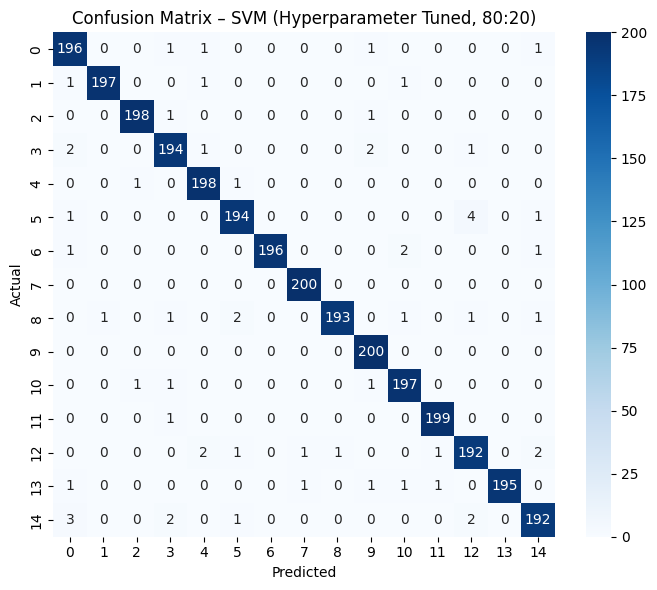

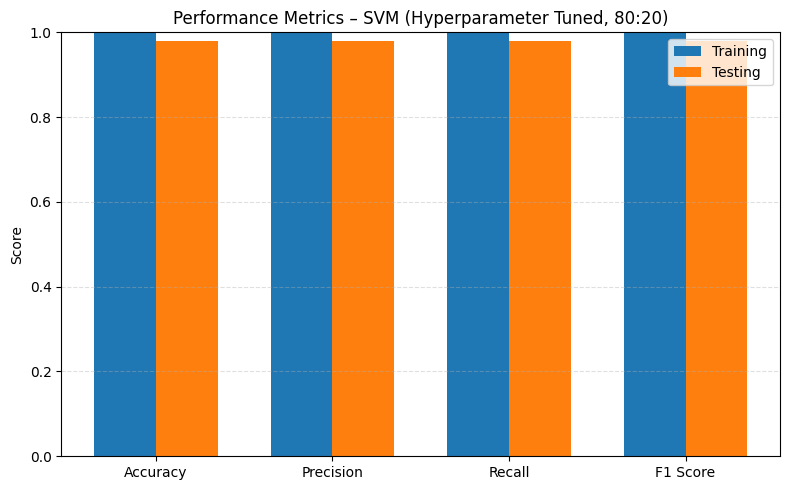


Model SVM terbaik disimpan sebagai: /content/drive/MyDrive/ML/model_SVM_best_80_20.pkl


In [ ]:
### FINAL MODEL

import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    confusion_matrix, classification_report
)
import seaborn as sns
import joblib

# ========================
# 1. LOAD DATA (split terbaik 80:20)
# ========================
X_train, X_test, y_train, y_test = load_split("80_20")

y_train_vec = y_train.values.ravel()
y_test_vec  = y_test.values.ravel()

print("Train shape:", X_train.shape)
print("Test  shape:", X_test.shape)

# ========================
# 2. STANDARISASI FITUR
# ========================
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled  = scaler.transform(X_test)

# ========================
# 3. GRID SEARCH HYPERPARAMETER
# ========================
param_grid = {
    "C": [1, 10, 100],
    "gamma": ["scale", "auto", 0.01, 0.001],
    "kernel": ["rbf"]
}

svm_clf = SVC()

grid = GridSearchCV(
    estimator=svm_clf,
    param_grid=param_grid,
    cv=5,
    scoring="accuracy",
    n_jobs=-1,
    refit=True,        # setelah CV, otomatis fit ulang di seluruh data train
    verbose=2
)

print("\n=== Mulai GridSearchCV untuk SVM (butuh waktu) ===")
grid.fit(X_train_scaled, y_train_vec)

print("\n=== HASIL GRID SEARCH ===")
print("Best params :", grid.best_params_)
print("Best CV acc :", grid.best_score_)

# Model terbaik sudah di-refit pada seluruh X_train_scaled
best_svm = grid.best_estimator_

# ========================
# 4. EVALUASI TRAIN & TEST
# ========================
y_pred_train = best_svm.predict(X_train_scaled)
y_pred_test  = best_svm.predict(X_test_scaled)

# METRIK TRAIN
acc_train  = accuracy_score(y_train_vec, y_pred_train)
prec_train = precision_score(y_train_vec, y_pred_train, average='weighted')
rec_train  = recall_score(y_train_vec, y_pred_train, average='weighted')
f1_train   = f1_score(y_train_vec, y_pred_train, average='weighted')

# METRIK TEST
acc_test  = accuracy_score(y_test_vec, y_pred_test)
prec_test = precision_score(y_test_vec, y_pred_test, average='weighted')
rec_test  = recall_score(y_test_vec, y_pred_test, average='weighted')
f1_test   = f1_score(y_test_vec, y_pred_test, average='weighted')

print("\n=== FINAL TRAIN METRICS (SVM tuned, 80:20) ===")
print("Accuracy :", acc_train)
print("Precision:", prec_train)
print("Recall   :", rec_train)
print("F1-Score :", f1_train)

print("\n=== FINAL TEST METRICS (SVM tuned, 80:20) ===")
print("Accuracy :", acc_test)
print("Precision:", prec_test)
print("Recall   :", rec_test)
print("F1-Score :", f1_test)

print("\n=== CLASSIFICATION REPORT (TEST) ===")
print(classification_report(y_test_vec, y_pred_test))

# ========================
# 5. VISUALISASI – CONFUSION MATRIX
# ========================
cm = confusion_matrix(y_test_vec, y_pred_test)

plt.figure(figsize=(7, 6))
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues")
plt.title("Confusion Matrix – SVM (Hyperparameter Tuned, 80:20)")
plt.xlabel("Predicted")
plt.ylabel("Actual")
plt.tight_layout()
plt.show()

# ========================
# 6. VISUALISASI – BAR CHART METRIK
# ========================
metrics_train = [acc_train, prec_train, rec_train, f1_train]
metrics_test  = [acc_test, prec_test, rec_test, f1_test]
labels = ["Accuracy", "Precision", "Recall", "F1 Score"]

x = np.arange(len(labels))
width = 0.35

plt.figure(figsize=(8, 5))
plt.bar(x - width/2, metrics_train, width=width, label="Training")
plt.bar(x + width/2, metrics_test,  width=width, label="Testing")

plt.xticks(x, labels)
plt.ylabel("Score")
plt.ylim(0, 1)
plt.title("Performance Metrics – SVM (Hyperparameter Tuned, 80:20)")
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.4)
plt.tight_layout()
plt.show()

# ========================
# 7. SIMPAN MODEL TERBAIK
# ========================
folder_path = "/content/drive/MyDrive/ML"
os.makedirs(folder_path, exist_ok=True)
save_path = os.path.join(folder_path, "model_SVM_best_80_20.pkl")

joblib.dump(
    {"model": best_svm, "scaler": scaler, "best_params": grid.best_params_},
    save_path
)

print(f"\nModel SVM terbaik disimpan sebagai: {save_path}")